In [16]:
import numpy as np
import pandas as pd
from datetime import datetime, timedelta
import cvxpy as cp
import pyswarms as ps
from scipy.optimize import minimize
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.arima.model import ARIMA
import seaborn as sns
import pandas_ta as ta
import matplotlib.pyplot as plt
import yfinance as yf

In [2]:
ticker_symbols = ["ALLY", "AMZN", "AXP", "AON", "AAPL", "BATRK", "BAC", "BYDDF", "COF", "CHTR"]
end_date_mv = datetime.today()
start_date_mv = end_date_mv - timedelta(days=5*365) 
adj_close_mv = pd.DataFrame()
for ticker in ticker_symbols:
    data_mv = yf.download(ticker, start=start_date_mv, end=end_date_mv)
    if "Adj Close" in data_mv.columns: 
        adj_close_mv[ticker] = data_mv["Adj Close"]
    else:
        print(f"Data not found for {ticker}")         
if len(adj_close_mv.columns) != len(ticker_symbols):
    missing_tickers = set(ticker_symbols) - set(adj_close_mv.columns)
    print(f"Missing data: {missing_tickers}")

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


In [3]:
end_date_mv = datetime.today()
start_date_mv = end_date_mv - timedelta(days=5*365) 
adj_close_mv = pd.DataFrame()
ticker_symbols = ["ALLY", "AMZN", "AXP", "AON", "AAPL", "BATRK", "BAC", "BYDDF", "COF", "CHTR"]
for ticker in ticker_symbols:
    data_mv = yf.download(ticker, start=start_date_mv, end=end_date_mv)
    if "Adj Close" in data_mv.columns: 
        adj_close_mv[ticker] = data_mv["Adj Close"]
    else:
        print(f"Data not found for {ticker}")         
if len(adj_close_mv.columns) != len(ticker_symbols):
    missing_tickers = set(ticker_symbols) - set(adj_close_mv.columns)
    print(f"Data not retrieved for the following tickers: {missing_tickers}")
else:
    print(adj_close_mv)

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

                 ALLY        AMZN         AXP         AON        AAPL  \
Date                                                                    
2019-04-26  25.845436   97.531502  109.637230  172.902420   49.169842   
2019-04-29  25.725302   96.921501  108.854134  171.366959   49.244453   
2019-04-30  25.639006   96.325996  109.292320  173.300644   48.296192   
2019-05-01  25.656267   95.575996  109.096512  169.048492   50.666840   
2019-05-02  25.587223   95.041000  109.310944  169.779587   50.337116   
...               ...         ...         ...         ...         ...   
2024-04-18  38.709999  179.220001  217.500000  308.700012  167.039993   
2024-04-19  39.049999  174.630005  231.039993  310.190002  165.000000   
2024-04-22  39.740002  177.229996  233.000000  311.019989  165.839996   
2024-04-23  39.709999  179.539993  238.960007  311.859985  166.899994   
2024-04-24  39.419998  177.159897  238.839996  308.119995         NaN   

                BATRK        BAC      BYDDF       

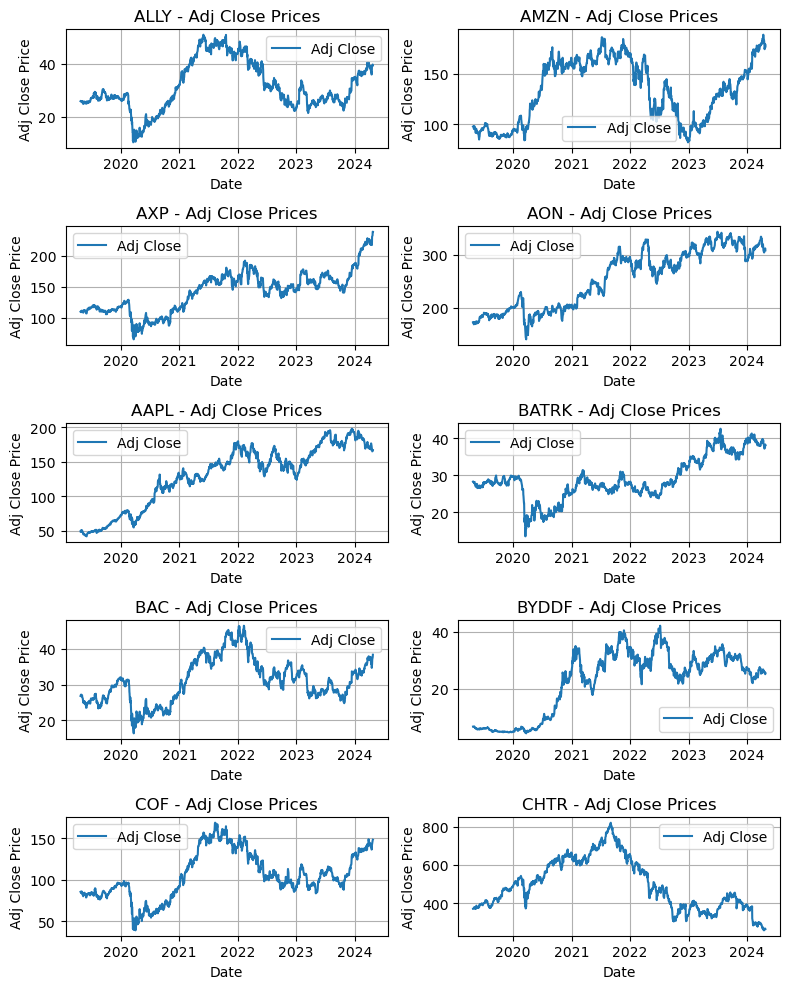

In [4]:
num_rows = 5  
num_cols = 2  
fig, axs = plt.subplots(num_rows, num_cols, figsize=(8, 10))  
for i, ticker in enumerate(adj_close_mv.columns):
    row = i // num_cols
    col = i % num_cols
    ax = axs[row, col]
    ax.plot(adj_close_mv.index, adj_close_mv[ticker], label='Adj Close')
    ax.set(title=f'{ticker} - Adj Close Prices', xlabel='Date', ylabel='Adj Close Price')
    ax.grid(True)
    ax.legend()
for i in range(len(ticker_symbols), num_rows * num_cols):
    row = i // num_cols
    col = i % num_cols
    axs[row, col].axis('off')
plt.tight_layout()
plt.show()

In [5]:
returns_mv = adj_close_mv.pct_change()
print(returns_mv)

                ALLY      AMZN       AXP       AON      AAPL     BATRK  \
Date                                                                     
2019-04-26       NaN       NaN       NaN       NaN       NaN       NaN   
2019-04-29 -0.004648 -0.006254 -0.007143 -0.008881  0.001517 -0.005664   
2019-04-30 -0.003355 -0.006144  0.004025  0.011284 -0.019256  0.002136   
2019-05-01  0.000673 -0.007786 -0.001792 -0.024536  0.049086 -0.007105   
2019-05-02 -0.002691 -0.005598  0.001966  0.004325 -0.006508 -0.000358   
...              ...       ...       ...       ...       ...       ...   
2024-04-18  0.067273 -0.011364 -0.000781  0.012829 -0.005714 -0.009333   
2024-04-19  0.008783 -0.025611  0.062253  0.004827 -0.012213  0.003499   
2024-04-22  0.017670  0.014889  0.008483  0.002676  0.005091  0.008584   
2024-04-23 -0.000755  0.013034  0.025579  0.002701  0.006392  0.018351   
2024-04-24 -0.007303 -0.013257 -0.000502 -0.011993  0.000000 -0.004832   

                 BAC     BYDDF       

In [6]:
log_returns = np.log(adj_close_mv / adj_close_mv.shift(1))
daily_log_portfolio_returns = (log_returns)
print(daily_log_portfolio_returns)

                ALLY      AMZN       AXP       AON      AAPL     BATRK  \
Date                                                                     
2019-04-26       NaN       NaN       NaN       NaN       NaN       NaN   
2019-04-29 -0.004659 -0.006274 -0.007168 -0.008920  0.001516 -0.005680   
2019-04-30 -0.003360 -0.006163  0.004017  0.011221 -0.019444  0.002134   
2019-05-01  0.000673 -0.007817 -0.001793 -0.024842  0.047919 -0.007130   
2019-05-02 -0.002695 -0.005613  0.001964  0.004315 -0.006529 -0.000358   
...              ...       ...       ...       ...       ...       ...   
2024-04-18  0.065107 -0.011429 -0.000781  0.012747 -0.005731 -0.009377   
2024-04-19  0.008745 -0.025945  0.060392  0.004815 -0.012288  0.003493   
2024-04-22  0.017515  0.014779  0.008448  0.002672  0.005078  0.008547   
2024-04-23 -0.000755  0.012950  0.025258  0.002697  0.006371  0.018185   
2024-04-24 -0.007330 -0.013345 -0.000502 -0.012065       NaN -0.004843   

                 BAC     BYDDF       

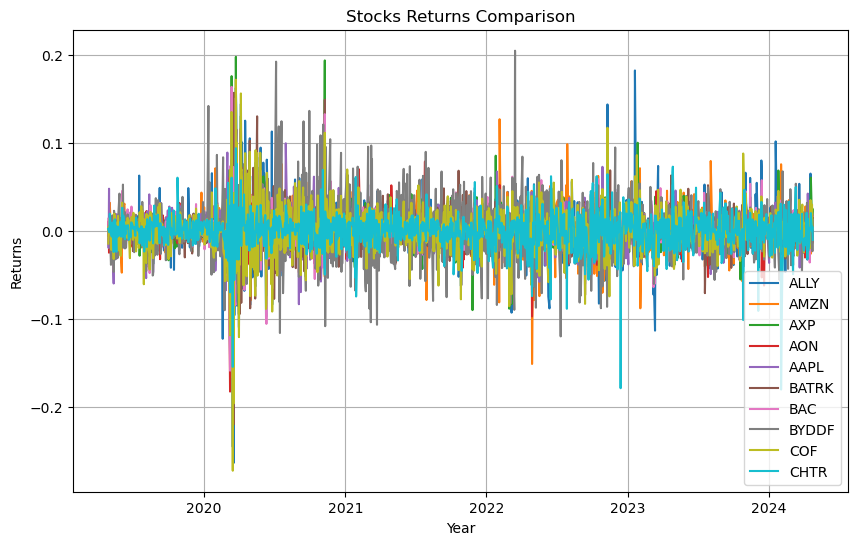

In [7]:
plt.figure(figsize=(10, 6))
for column in daily_log_portfolio_returns.columns:
    plt.plot(daily_log_portfolio_returns.index, daily_log_portfolio_returns[column], label=column)

plt.title('Stocks Returns Comparison')
plt.xlabel('Year')
plt.ylabel('Returns')
plt.legend()
plt.grid(True)
plt.show()

C:\Users\HP\AppData\Local\Temp\ipykernel_6752\448028849.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(daily_log_portfolio_returns[column], shade=True, label=column)
C:\Users\HP\AppData\Local\Temp\ipykernel_6752\448028849.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(daily_log_portfolio_returns[column], shade=True, label=column)
C:\Users\HP\AppData\Local\Temp\ipykernel_6752\448028849.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(daily_log_portfolio_returns[column], shade=True, label=column)
C:\Users\HP\AppData\Local\Temp\ipykernel_6752\448028849.py:3: FutureWarning: 

`shade` is now deprecated in favor o

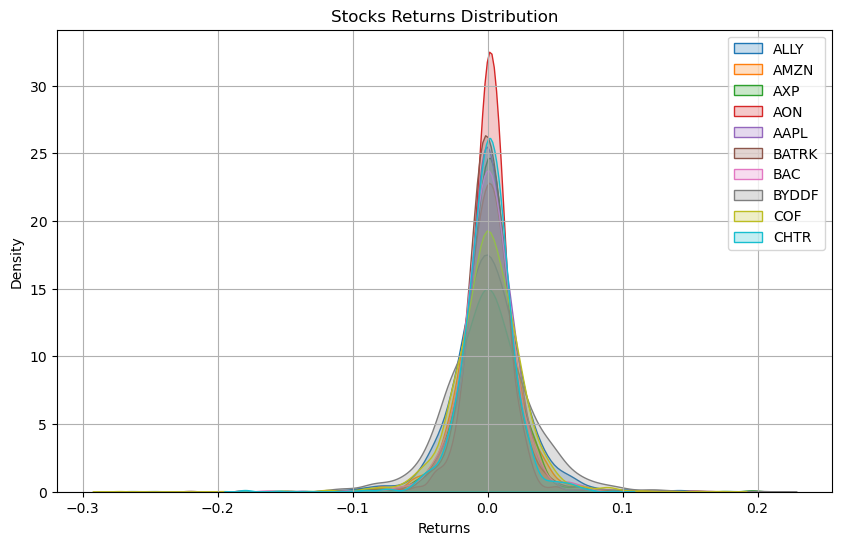

In [9]:
plt.figure(figsize=(10, 6))
for column in daily_log_portfolio_returns.columns:
    sns.kdeplot(daily_log_portfolio_returns[column], shade=True, label=column)

plt.title('Stocks Returns Distribution')
plt.xlabel('Returns')
plt.ylabel('Density')
plt.legend()
plt.grid(True)
plt.show()

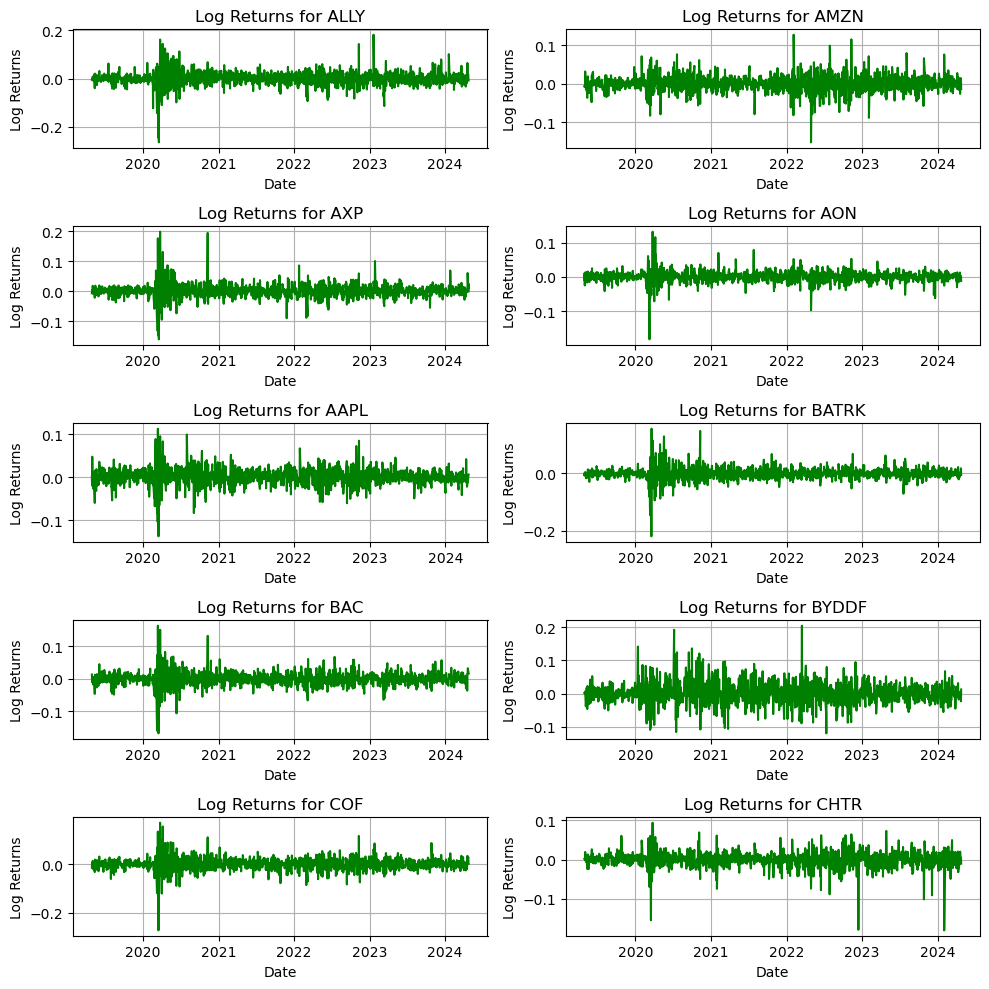

In [11]:
log_returns = np.log(adj_close_mv / adj_close_mv.shift(1))
num_rows = len(ticker_symbols) // 2 + len(ticker_symbols) % 2
num_cols = 2
fig, axs = plt.subplots(num_rows, num_cols, figsize=(10, 2 * num_rows))

for i, ticker in enumerate(log_returns.columns):
    row = i // num_cols
    col = i % num_cols
    ax = axs[row, col]
    ax.plot(log_returns.index, log_returns[ticker], label='Log Returns', color='green')
    ax.set(title=f'Log Returns for {ticker}', xlabel='Date', ylabel='Log Returns')
    ax.grid(True)

for i in range(len(ticker_symbols), num_rows * num_cols):
    row = i // num_cols
    col = i % num_cols
    axs[row, col].axis('off')

plt.tight_layout()

[*********************100%%**********************]  10 of 10 completed


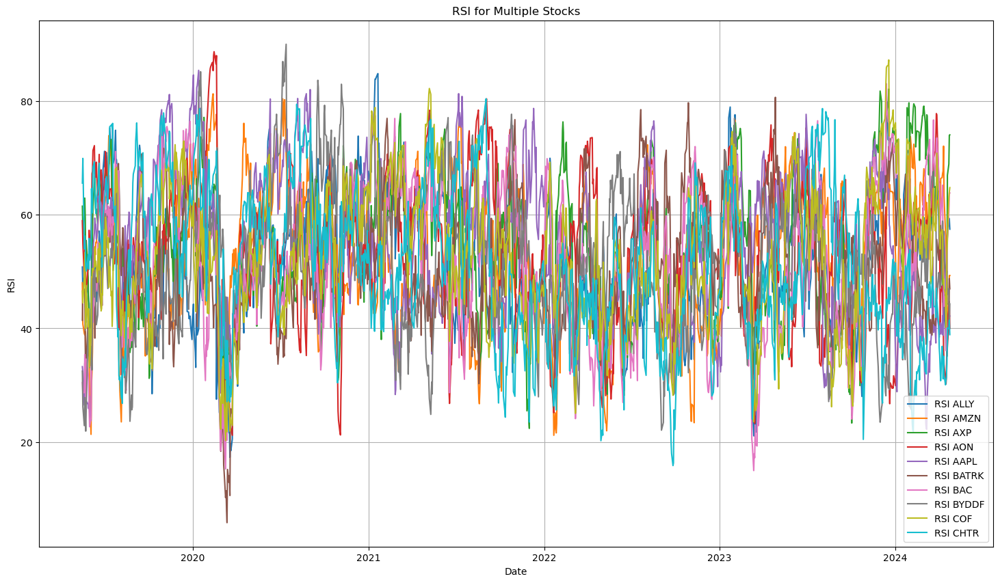

In [13]:
ticker_symbols = ["ALLY", "AMZN", "AXP", "AON", "AAPL", "BATRK", "BAC", "BYDDF", "COF", "CHTR"]
end_date = pd.to_datetime('today')
start_date = end_date - pd.Timedelta(days=5*365)
datax = yf.download(ticker_symbols, start=start_date, end=end_date)['Adj Close']
datax.index = pd.to_datetime(datax.index)
for stock in ticker_symbols:
    datax[f'RSI_{stock}'] = ta.rsi(datax[stock], length=14)
plt.figure(figsize=(18, 10))

for stock in ticker_symbols:
    plt.plot(datax.index, datax[f'RSI_{stock}'], label=f'RSI {stock}')
plt.legend()
plt.grid(True)
plt.title('RSI for Multiple Stocks')
plt.xlabel('Date')
plt.ylabel('RSI')
plt.show()

[*********************100%%**********************]  10 of 10 completed


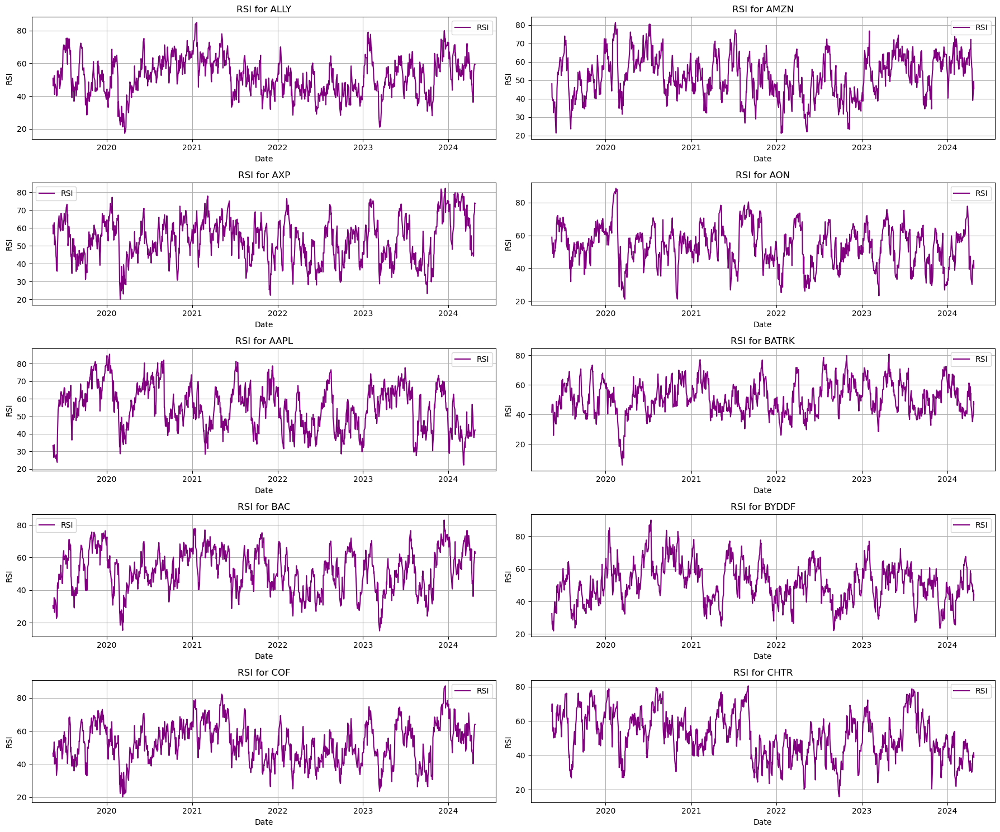

In [14]:
ticker_symbols = ["ALLY", "AMZN", "AXP", "AON", "AAPL", "BATRK", "BAC", "BYDDF", "COF", "CHTR"]
end_date = pd.to_datetime('today')
start_date = end_date - pd.Timedelta(days=5*365)
datax = yf.download(ticker_symbols, start=start_date, end=end_date)['Adj Close']
datax.index = pd.to_datetime(datax.index)
for stock in ticker_symbols:
    datax[f'RSI_{stock}'] = ta.rsi(datax[stock], length=14)

num_rows = 5
num_cols = 2

fig, axs = plt.subplots(num_rows, num_cols, figsize=(18, 15))

for i, stock in enumerate(ticker_symbols):
    ax = axs[i // num_cols, i % num_cols]
    ax.plot(datax.index, datax[f'RSI_{stock}'], label='RSI', color='purple')
    ax.set(title=f'RSI for {stock}', xlabel='Date', ylabel='RSI')
    ax.legend()
    ax.grid(True)

for ax in axs.flatten()[len(ticker_symbols):]:
    ax.axis('off')
plt.tight_layout()
plt.show()


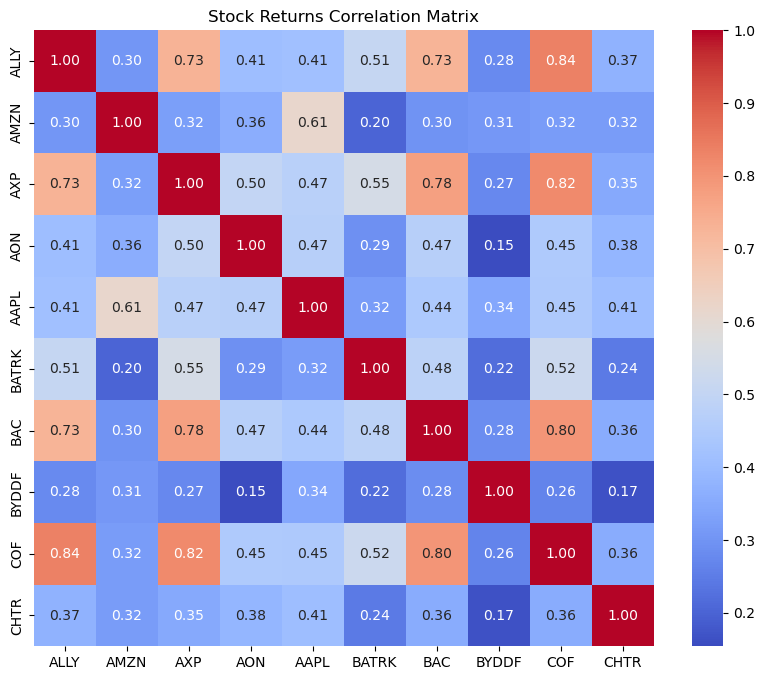

In [15]:
corr_matrix = log_returns.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Stock Returns Correlation Matrix')
plt.show()

# Mean variance optimization 

In [17]:
returns_mv = adj_close_mv.pct_change()
cov_matrix_mvo = returns_mv.cov()*252
num_assets_mvo = len(ticker_symbols)
mean_returns_mvo = returns_mv.mean()*252
def portfolio_volatility_mvo(weights_mvo, mean_returns_mvo, cov_matrix_mvo):
    portfolio_return_mvo = np.dot(weights_mvo, mean_returns_mvo) 
    portfolio_vol_mvo = np.sqrt(np.dot(weights_mvo.T, np.dot(cov_matrix_mvo, weights_mvo)))
    return portfolio_vol_mvo
def minimize_volatility_mvo(weights_mvo):
    return portfolio_volatility_mvo(weights_mvo, mean_returns_mvo, cov_matrix_mvo)
constraints_mvo = ({'type': 'eq', 'fun': lambda x: np.sum(x) - 1}) 
bounds_mvo = tuple((0.05, 1) for asset in range(num_assets_mvo))
initial_weights_mvo = num_assets_mvo * [1. / num_assets_mvo, ]
result_mvo = minimize(minimize_volatility_mvo, initial_weights_mvo, method='SLSQP', bounds=bounds_mvo, constraints=constraints_mvo)
if not result_mvo.success:
    raise Exception(result_mvo.message)
optimized_weights_mvo = result_mvo.x
expected_portfolio_return_mvo = np.dot(optimized_weights_mvo, mean_returns_mvo)
expected_portfolio_volatility_mvo = portfolio_volatility_mvo(optimized_weights_mvo, mean_returns_mvo, cov_matrix_mvo)
portfolio_variance_mvo = np.dot(optimized_weights_mvo.T, np.dot(cov_matrix_mvo, optimized_weights_mvo))
risk_free_rate = 0.02
sharpe_ratio_mvo = (expected_portfolio_return_mvo - risk_free_rate) / expected_portfolio_volatility_mvo
print("Optimized Weights_mvo:", optimized_weights_mvo)
print("Expected Portfolio Return_mvo:", expected_portfolio_return_mvo)
print("Expected Portfolio Volatility_mvo:", expected_portfolio_volatility_mvo)
print("Portfolio Variance:", portfolio_variance_mvo)
print("Sharpe Ratio_mvo:", sharpe_ratio_mvo)

Optimized Weights_mvo: [0.05       0.10736596 0.05       0.32163345 0.05       0.10973158
 0.05       0.05       0.05       0.161269  ]
Expected Portfolio Return_mvo: 0.15300055328209194
Expected Portfolio Volatility_mvo: 0.23000268690583794
Portfolio Variance: 0.05290123598390492
Sharpe Ratio_mvo: 0.5782565198316217


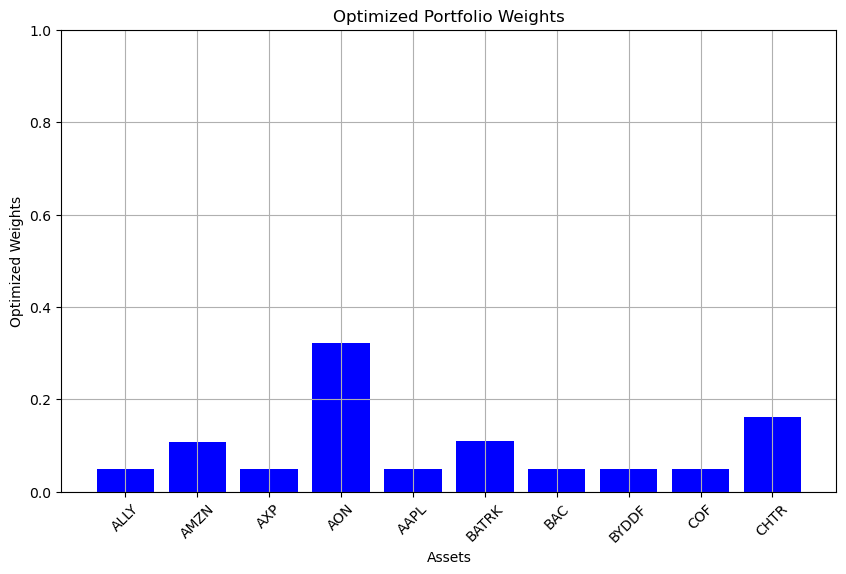

In [18]:
optimized_weights_mvo = result_mvo.x
fig, ax = plt.subplots(figsize=(10, 6))
ax.bar(ticker_symbols, optimized_weights_mvo, color='blue')
ax.set_ylim(0, 1) 
plt.xticks(rotation=45)  
plt.grid(True)  
plt.show()
ax.set_xlabel('Assets')
ax.set_ylabel('Optimized Weights')
ax.set_title('Optimized Portfolio Weights')

# BLACK LITTERMAN MODEL 

In [19]:
import pypfopt
from pypfopt.efficient_frontier import EfficientFrontier
from pypfopt import black_litterman, risk_models, expected_returns
from pypfopt.black_litterman import BlackLittermanModel
from pypfopt.black_litterman import BlackLittermanModel, market_implied_prior_returns

In [12]:
from pypfopt import BlackLittermanModel, risk_models, expected_returns, EfficientFrontier
prior_bl = mean_returns_mvo 
viewdict_bl = {
    'ALLY': 0.04, 'AMZN': 0.077, 'AXP': 0.06, 'AON': 0.005,
    'AAPL': 0.02, 'BATRK': 0.02, 'BAC': 0.03, 'BYDDF': 0.02,
    'COF': 0.04, 'CHTR': 0.05
}
viewdict_bl = {k: v for k, v in viewdict_bl.items() if k in returns_mv.columns}
bl = BlackLittermanModel(cov_matrix_mvo, pi=prior_bl, absolute_views=viewdict_bl)
rets_bl = bl.bl_returns()
ef_bl = EfficientFrontier(rets_bl, cov_matrix_mvo, weight_bounds=(0.05, 1))
bl_weights = ef_bl.max_sharpe()
cleaned_weights_bl = ef_bl.clean_weights()
expected_return_bl, expected_volatility_bl, sharpe_ratio_bl = ef_bl.portfolio_performance(verbose=False)
portfolio_variance_bl = expected_volatility_bl ** 2
print("Optimized Weights:")
for ticker, weight in cleaned_weights_bl.items():
    print(f"{ticker}: {weight:.4f}")
print(f"\nExpected Annual Return: {expected_return_bl:.2%}")
print(f"Annual Volatility: {expected_volatility_bl:.2%}")
print(f"Portfolio Variance: {portfolio_variance_bl:.4%}")
print(f"Sharpe Ratio: {sharpe_ratio_bl:.2f}")

Optimized Weights:
ALLY: 0.0500
AMZN: 0.0500
AXP: 0.0500
AON: 0.0500
AAPL: 0.3887
BATRK: 0.0500
BAC: 0.0500
BYDDF: 0.2113
COF: 0.0500
CHTR: 0.0500

Expected Annual Return: 10.71%
Annual Volatility: 27.26%
Portfolio Variance: 7.4327%
Sharpe Ratio: 0.32


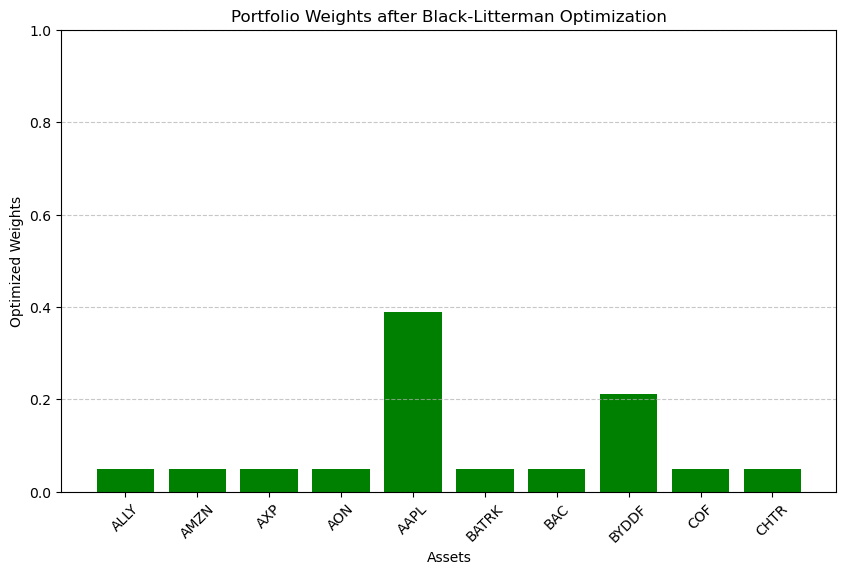

In [13]:
cleaned_weights_bl = ef_bl.clean_weights()
tickers_bl = list(cleaned_weights_bl.keys())
weights_bl = [cleaned_weights_bl[ticker] for ticker in tickers_bl]

fig, ax = plt.subplots(figsize=(10, 6))
ax.bar(tickers_bl, weights_bl, color='green')
ax.set_xlabel('Assets')
ax.set_ylabel('Optimized Weights')
ax.set_title('Portfolio Weights after Black-Litterman Optimization')
ax.set_ylim(0, 1)  
plt.xticks(rotation=45)  
plt.grid(axis='y', linestyle='--', alpha=0.7) 
plt.show()


# MONTE CARLO 

Optimal Portfolio Weights:

ALLY: 0.02
AMZN: 0.01
AXP: 0.19
AON: 0.08
AAPL: 0.07
BATRK: 0.01
BAC: 0.17
BYDDF: 0.20
COF: 0.06
CHTR: 0.19

Optimal Expected Annual Return: 26.83%
Optimal Annual Variance: 7.71%
Optimal Annual Standard Deviation: 27.76%
Optimal Sharpe Ratio: 0.89


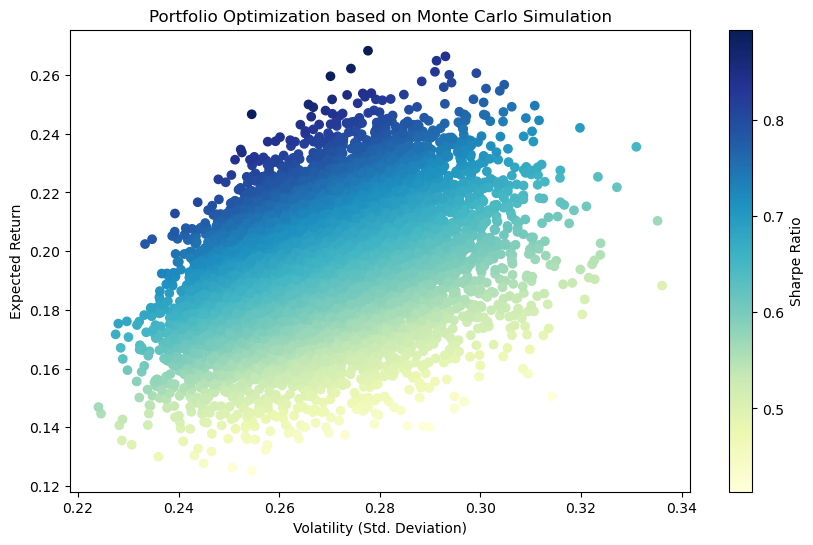

In [22]:
risk_free_rate = 0.02
returns = adj_close_mv.pct_change()
num_portfolios_mc = 10000
results = np.zeros((3, num_portfolios_mc))
for i in range(num_portfolios_mc):
    weights = np.random.random(len(ticker_symbols))
    weights /= np.sum(weights)
    portfolio_return_mc = np.sum(weights * returns.mean()) * 252 
    portfolio_variance_mc = np.dot(weights.T, np.dot(returns.cov() * 252, weights))
    portfolio_std_dev_mc = np.sqrt(portfolio_variance_mc)
    sharpe_ratio_mc = (portfolio_return_mc - risk_free_rate) / portfolio_std_dev_mc
    results[0,i] = portfolio_return_mc
    results[1,i] = portfolio_std_dev_mc
    results[2,i] = sharpe_ratio_mc
optimal_vol_mc = results[1, best_sharpe_idx]
optimal_sharpe_mc = results[2, best_sharpe_idx]
optimal_weights_mc = np.random.random(len(ticker_symbols))
optimal_weights_mc /= np.sum(optimal_weights_mc)     
best_sharpe_idx = np.argmax(results[2])
optimal_rtn_mc = results[0, best_sharpe_idx]
print("Optimal Portfolio Weights:\n")
for i, ticker in enumerate(ticker_symbols):
    print(f"{ticker}: {optimal_weights_mc[i]:.2f}")
print(f"\nOptimal Expected Annual Return: {optimal_rtn_mc:.2%}")
print(f"Optimal Annual Variance: {optimal_vol_mc**2:.2%}")
print(f"Optimal Annual Standard Deviation: {optimal_vol_mc:.2%}")
print(f"Optimal Sharpe Ratio: {optimal_sharpe_mc:.2f}")
plt.figure(figsize=(10, 6))
plt.scatter(results[1], results[0], c=results[2], cmap='YlGnBu')
plt.colorbar(label='Sharpe Ratio')
plt.xlabel('Volatility (Std. Deviation)')
plt.ylabel('Expected Return')
plt.title('Portfolio Optimization based on Monte Carlo Simulation')
plt.show()

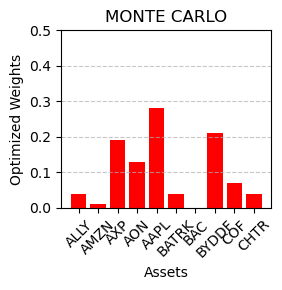

In [24]:
optimized_weights = {
    'ALLY': 0.04, 'AMZN': 0.01, 'AXP': 0.19, 'AON': 0.13,
    'AAPL': 0.28, 'BATRK': 0.04, 'BAC': 0.00, 'BYDDF': 0.21,
    'COF': 0.07, 'CHTR': 0.04
}
assets = list(optimized_weights.keys())
weights = list(optimized_weights.values())

plt.figure(figsize=(3, 3)) 
plt.bar(assets, weights, color='red')  
plt.xlabel('Assets')  
plt.ylabel('Optimized Weights')  
plt.title('MONTE CARLO')  
plt.xticks(rotation=45)  
plt.tight_layout() 
plt.ylim(0, 0.5)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()  # 显示

# RISK PARITY

In [15]:
volatilities_rp = returns_mv.std()
inverse_volatility_rp = 1 / volatilities_rp
weights_rp = inverse_volatility_rp / inverse_volatility_rp.sum()
expected_return_rp = np.sum(weights_rp * returns_mv.mean()) * 252 
covariance_matrix_rp = returns_mv.cov() * 252 
portfolio_variance_rp = np.dot(weights_rp.T, np.dot(covariance_matrix_rp, weights_rp))
portfolio_std_dev_rp = np.sqrt(portfolio_variance_rp)
risk_free_rate = 0.02
sharpe_ratio_rp = (expected_return_rp - risk_free_rate) / portfolio_std_dev_rp
print("Risk Parity Portfolio Weights:\n")
for ticker, weight in weights_rp.items():
    print(f"{ticker}: {weight:.4f}")
print(f"\nExpected Annual Return: {expected_return_rp:.2%}")
print(f"Annual Variance: {portfolio_variance_rp:.4f}")
print(f"Annual Standard Deviation: {portfolio_std_dev_rp:.2%}")
print(f"Sharpe Ratio: {sharpe_ratio_rp:.2f}")

Risk Parity Portfolio Weights:

ALLY: 0.0762
AMZN: 0.1042
AXP: 0.0964
AON: 0.1372
AAPL: 0.1149
BATRK: 0.1042
BAC: 0.1026
BYDDF: 0.0680
COF: 0.0833
CHTR: 0.1129

Expected Annual Return: 17.83%
Annual Variance: 0.0639
Annual Standard Deviation: 25.27%
Sharpe Ratio: 0.63


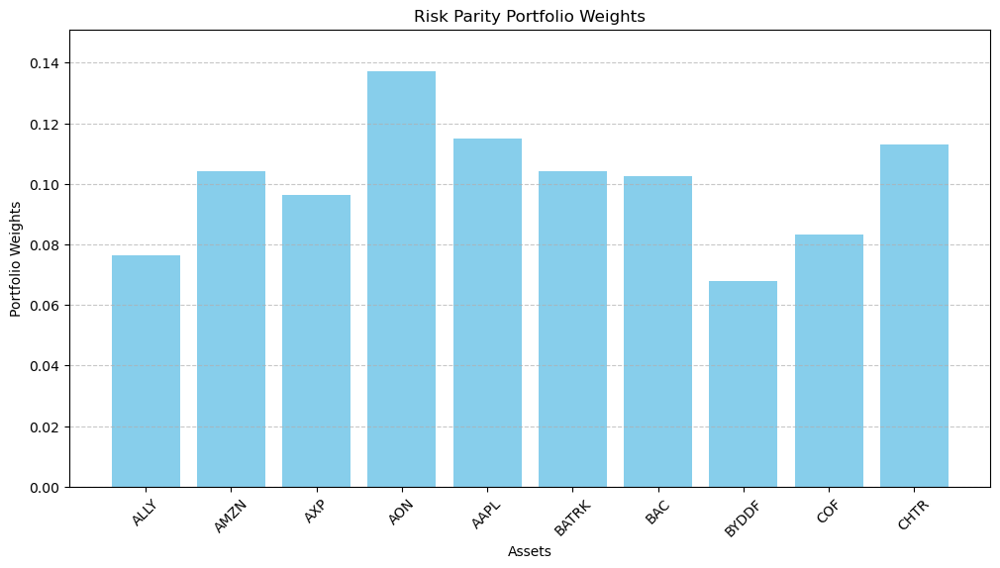

In [16]:
tickers_rp = weights_rp.index
portfolio_weights_rp = weights_rp.values
fig, ax = plt.subplots(figsize=(12, 6))
ax.bar(tickers_rp, portfolio_weights_rp, color='skyblue')
ax.set_xlabel('Assets')
ax.set_ylabel('Portfolio Weights')
ax.set_title('Risk Parity Portfolio Weights')
ax.set_ylim(0, max(portfolio_weights_rp) * 1.1)  
plt.xticks(rotation=45)  
plt.grid(axis='y', linestyle='--', alpha=0.7)  
plt.show()

# modelling tranaction costs 

In [17]:
np.random.seed(0)
n_assets_mtc = 10
returns_mtc = np.random.normal(0.01, 0.02, (250, n_assets_mtc))  
expected_returns_mtc = np.mean(returns_mtc, axis=0)  * 252
covariance_matrix_mtc = np.cov(returns_mtc, rowvar=False) * 252
weights_mtc = cp.Variable(n_assets_mtc)
risk_free_rate = 0.02  
portfolio_return_mtc = expected_returns_mtc @ weights_mtc
penalty_factor_mtc = 0.5  
objective_mtc = cp.Maximize(portfolio_return_mtc - penalty_factor_mtc * cp.norm(weights_mtc, 2))
constraints_mtc = [cp.sum(weights_mtc) == 1, weights_mtc >= 0]
problem_mtc = cp.Problem(objective_mtc, constraints_mtc)
problem_mtc.solve(solver=cp.ECOS)
optimal_weights_mtc = weights_mtc.value
portfolio_return_value_mtc = portfolio_return_mtc.value
portfolio_variance_mtc = cp.quad_form(weights_mtc, covariance_matrix_mtc).value
portfolio_std_dev_mtc = np.sqrt(portfolio_variance_mtc)
sharpe_ratio_value_mtc = (portfolio_return_value_mtc - risk_free_rate) / portfolio_std_dev_mtc
print("Optimal Weights:")
for i, weight in enumerate(optimal_weights_mtc):
    print(f"Asset {i + 1}: {weight:.4f}")
print(f"Expected Portfolio Return: {portfolio_return_value_mtc:.4f}")
print(f"Portfolio Variance: {portfolio_variance_mtc:.6f}")
print(f"Portfolio Standard Deviation: {portfolio_std_dev_mtc:.6f}")
print(f"Sharpe Ratio: {sharpe_ratio_value_mtc:.6f}")

Optimal Weights:
Asset 1: 0.0000
Asset 2: 0.0000
Asset 3: 0.0763
Asset 4: 0.0000
Asset 5: 0.0000
Asset 6: 0.1165
Asset 7: 0.0493
Asset 8: 0.0660
Asset 9: 0.2457
Asset 10: 0.4461
Expected Portfolio Return: 2.7021
Portfolio Variance: 0.024496
Portfolio Standard Deviation: 0.156511
Sharpe Ratio: 17.136746


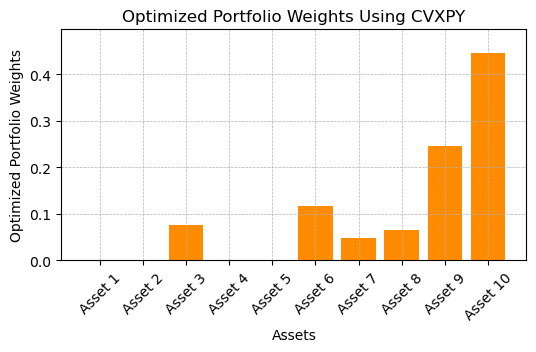

In [18]:
asset_labels_mtc = [f"Asset {i+1}" for i in range(n_assets_mtc)]  
fig, ax = plt.subplots(figsize=(6, 3))
ax.bar(asset_labels_mtc, optimal_weights_mtc, color='darkorange')
ax.set_xlabel('Assets')
ax.set_ylabel('Optimized Portfolio Weights')
ax.set_title('Optimized Portfolio Weights Using CVXPY')
ax.set_ylim(0, max(optimal_weights_mtc) + 0.05)  
plt.xticks(rotation=45)  
plt.grid(True, which='both', linestyle='--', linewidth=0.5)  
plt.show()

# maximum entropy portfolio maximization 

In [19]:
! pip install cvxpy numpy

In [20]:
ticker_symbols = ["ALLY", "AMZN", "AXP", "AON", "AAPL", "BATRK", "BAC", "BYDDF", "COF", "CHTR"]
end_date_mep = datetime.today()
start_date_mep = end_date_mep - timedelta(days=252)
data_mep = yf.download(ticker_symbols, start=start_date_mep, end=end_date_mep)['Adj Close']
returns_mep = data_mep.pct_change().dropna() 
mean_returns_mep = returns_mep.mean(axis=0) * 252
cov_matrix_mep = returns_mep.cov() * 252
n_mep = len(ticker_symbols)
weights_mep = cp.Variable(n_mep)
objective_mep = cp.Maximize(cp.sum(cp.entr(weights_mep)))
constraints_mep = [
    cp.sum(weights_mep) == 1,  
    weights_mep >= 0           
]
optimal_weights_mep = weights_mep.value
expected_return_mep = mean_returns_mep @ optimal_weights_mep
portfolio_variance_mep = cp.quad_form(weights_mep, cov_matrix_mep).value
portfolio_std_dev_mep = np.sqrt(portfolio_variance_mep)
problem_mep = cp.Problem(objective_mep, constraints_mep)
problem_mep.solve(solver=cp.ECOS)
sharpe_ratio_mep = (expected_return_mep) / portfolio_std_dev_mep
print("Optimal weights:")
for stock, weight in zip(ticker_symbols, optimal_weights_mep):
    print(f"{stock}: {weight:.2f}")
print(f"Expected Portfolio Return: {expected_return_mep:.4f}")
print(f"Portfolio Variance: {portfolio_variance_mep:.4f}")
print(f"Portfolio Standard Deviation: {portfolio_std_dev_mep:.4f}")
sharpe_ratio_mep = (expected_return_mep) / portfolio_std_dev_mep
print(f"Sharpe Ratio: {sharpe_ratio_mep:.4f}")

[*********************100%%**********************]  10 of 10 completed

Optimal weights:
ALLY: 0.10
AMZN: 0.10
AXP: 0.10
AON: 0.10
AAPL: 0.10
BATRK: 0.10
BAC: 0.10
BYDDF: 0.10
COF: 0.10
CHTR: 0.10
Expected Portfolio Return: 0.0901
Portfolio Variance: 0.0229
Portfolio Standard Deviation: 0.1513
Sharpe Ratio: 0.5954


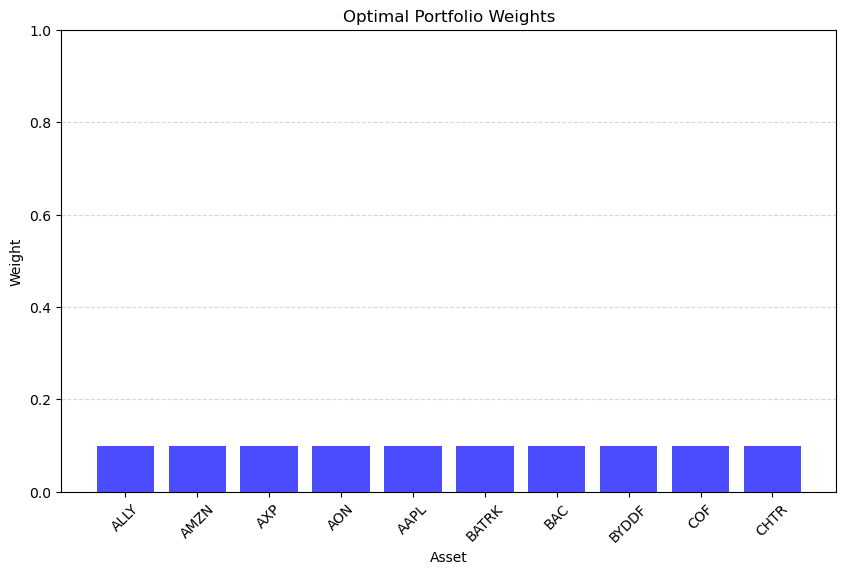

In [21]:
plt.figure(figsize=(10, 6))
plt.bar(ticker_symbols, optimal_weights_mep, color='blue', alpha=0.7)
plt.title('Optimal Portfolio Weights')
plt.xlabel('Asset')
plt.ylabel('Weight')
plt.ylim(0, 1)  
plt.xticks(rotation=45)  
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.show()

# grey wolf optimization 

In [22]:
returns_gw = adj_close_mv.pct_change().dropna()
def objective(weights_gw):
    portfolio_return_gw = np.dot(weights_gw, returns_gw.mean()) * 252
    portfolio_volatility_gw = np.sqrt(np.dot(weights_gw.T, np.dot(returns_gw.cov() * 252, weights_gw)))
    return -portfolio_return_gw / (portfolio_volatility_gw + 1e-8)

def grey_wolf_optimizer(dim_gw, pop_size_gw, max_iter_gw):   
    alpha, beta, delta = None, None, None
    alpha_score_gw, beta_score_gw, delta_score_gw = float('inf'), float('inf'), float('inf')
    
    wolves_gw = np.random.rand(pop_size_gw, dim_gw)
    wolves_gw /= np.sum(wolves_gw, axis=1)[:, None]

    for _ in range(max_iter_gw):
        for i in range(pop_size_gw):
            fitness = objective(wolves_gw[i])
            if fitness < alpha_score_gw:
                alpha_score_gw, alpha = fitness, wolves_gw[i]
            elif fitness < beta_score_gw:
                beta_score_gw, beta = fitness, wolves_gw[i]
            elif fitness < delta_score_gw:
                delta_score_gw, delta = fitness, wolves_gw[i]

        for i in range(pop_size_gw):
            for j in range(dim_gw):
                A1, A2, A3 = 2 * np.random.rand(3) - 1
                C1, C2, C3 = 2 * np.random.rand(3)
                D_alpha = abs(C1 * alpha[j] - wolves_gw[i][j])
                D_beta = abs(C2 * beta[j] - wolves_gw[i][j])
                D_delta = abs(C3 * delta[j] - wolves_gw[i][j])
                
                X1 = alpha[j] - A1 * D_alpha
                X2 = beta[j] - A2 * D_beta
                X3 = delta[j] - A3 * D_delta
                
                wolves_gw[i][j] = (X1 + X2 + X3) / 3
            
            wolves_gw[i] = np.clip(wolves_gw[i], 0, 1)
            wolves_gw[i] /= np.sum(wolves_gw[i])

    return alpha, -alpha_score_gw

def portfolio_standard_deviation(weights_gw):
   
    return np.sqrt(portfolio_variance(weights_gw))

dim_gw1 = len(ticker_symbols)
pop_size_gw1 = 30
max_iter_gw1 = 100
best_weights_gw1, best_sharpe_gw1 = grey_wolf_optimizer(dim_gw1, pop_size_gw1, max_iter_gw1)
print("Optimal Weights:", best_weights_gw1)
print("Best Sharpe Ratio:", best_sharpe_gw1)
portfolio_return_gw1 = np.dot(best_weights_gw1, returns_gw.mean()) * 252
portfolio_var_gw1 = portfolio_variance(best_weights_gw1)
portfolio_std_dev_gw1 = portfolio_standard_deviation(best_weights_gw1)
print("Expected Portfolio Return:", portfolio_return_gw1)
print("Portfolio Variance:", portfolio_var_gw1)
print("Portfolio Standard Deviation (Volatility):", portfolio_std_dev_gw1)

def portfolio_variance(weights_gw):
    
    return np.dot(weights_gw.T, np.dot(returns_gw.cov() * 252, weights_gw))

Optimal Weights: [3.82369178e-05 5.09243090e-04 3.62332171e-02 3.80911866e-01
 3.67524020e-01 1.51456049e-03 1.00439458e-03 1.81725701e-01
 2.73778815e-03 2.78009724e-02]
Best Sharpe Ratio: 1.05127476293567
Expected Portfolio Return: 0.2500013864445479
Portfolio Variance: 0.06198432950162212
Portfolio Standard Deviation (Volatility): 0.24896652285321838


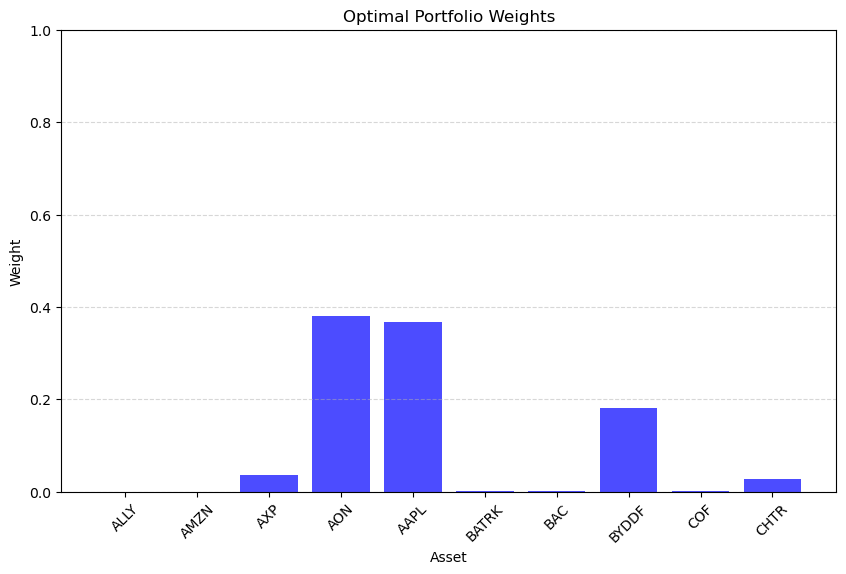

In [23]:
plt.figure(figsize=(10, 6))
plt.bar(ticker_symbols, best_weights_gw1, color='blue', alpha=0.7)
plt.title('Optimal Portfolio Weights')
plt.xlabel('Asset')
plt.ylabel('Weight')
plt.ylim(0, 1)  
plt.xticks(rotation=45)  
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.show()

# PARTICLE SWARN 

In [24]:
! pip install pyswarms

In [25]:
returns_ps = adj_close_mv.pct_change().dropna()
def sharpe_ratio_ps(x, returns_ps):
    x = x / np.sum(x) 
    portfolio_returns_ps = np.dot(returns_ps, x.T) 
    portfolio_std_dev_ps = np.std(portfolio_returns_ps)
    portfolio_mean_return_ps = np.mean(portfolio_returns_ps)
    portfolio_std_dev_ps = np.std(portfolio_returns_ps)
    sharpe_ratio_ps = portfolio_mean_return_ps / portfolio_std_dev_ps
    return -sharpe_ratio_ps 
options_ps = {'c1': 0.5, 'c2': 0.3, 'w': 0.9}
bounds_ps = (np.zeros(len(ticker_symbols)), np.ones(len(ticker_symbols)))
optimizer_ps = ps.single.GlobalBestPSO(n_particles=50, dimensions=len(ticker_symbols), options=options_ps, bounds=bounds_ps)
cost_ps, pos_ps = optimizer_ps.optimize(sharpe_ratio_ps, iters=100, returns_ps=returns_ps)
optimized_weights_ps = pos_ps / np.sum(pos_ps)
portfolio_returns_ps = np.dot(returns_ps, optimized_weights_ps)
portfolio_mean_return_ps = np.mean(portfolio_returns_ps) * 252  
portfolio_variance_ps = np.dot(optimized_weights_ps.T, np.dot(returns_ps.cov() * 252, optimized_weights_ps)) 
portfolio_std_dev_ps = np.sqrt(portfolio_variance_ps)
print("Optimal Portfolio Weights:")
for ticker, weight in zip(ticker_symbols, optimized_weights_ps):
    print(f"{ticker}: {weight:.4%}")
print(f"Annualized Return: {portfolio_mean_return_ps:.2%}")
print(f"Annualized Variance: {portfolio_variance_ps:.4f}")
print(f"Annualized Standard Deviation: {portfolio_std_dev_ps:.2%}")

2024-04-17 23:59:34,655 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.5, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=-.0445
2024-04-17 23:59:35,013 - pyswarms.single.global_best - INFO - Optimization finished | best cost: -0.044516529986930856, best pos: [0.32186961 0.60802336 0.73527008 0.50844538 0.70130941 0.61080252
 0.81698777 0.10279466 0.8037243  0.54659552]


Optimal Portfolio Weights:
ALLY: 5.5921%
AMZN: 10.5636%
AXP: 12.7744%
AON: 8.8336%
AAPL: 12.1843%
BATRK: 10.6119%
BAC: 14.1941%
BYDDF: 1.7859%
COF: 13.9637%
CHTR: 9.4964%
Annualized Return: 17.27%
Annualized Variance: 0.0714
Annualized Standard Deviation: 26.73%


In [26]:
sharpe_ratio_psn = (portfolio_mean_return_ps - 0.02) / portfolio_std_dev_ps
print("Sharpe Ratio:", sharpe_ratio_psn)

Sharpe Ratio: 0.5712056228339042


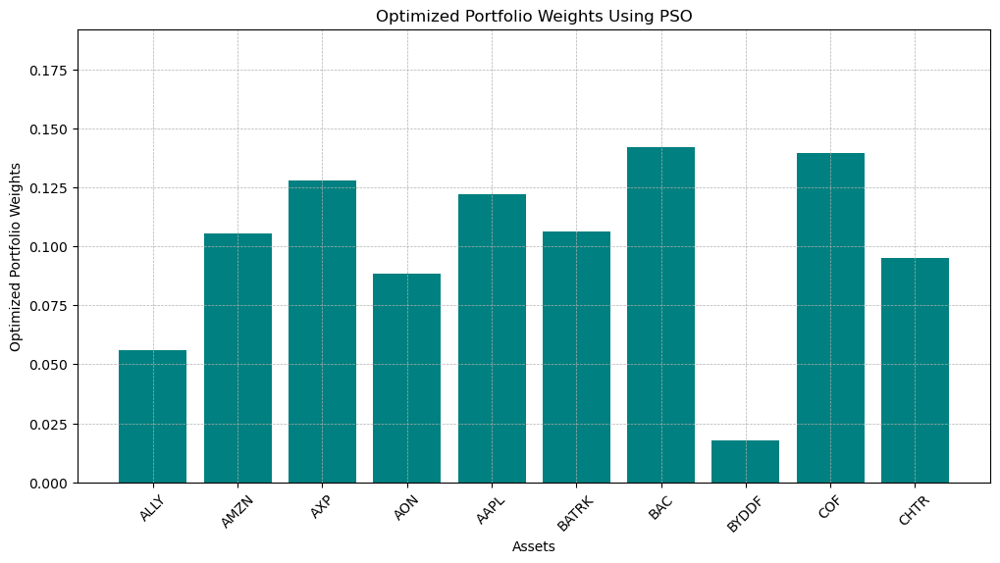

In [27]:
tickers_ps = ticker_symbols
portfolio_weights_ps = optimized_weights_ps
fig, ax = plt.subplots(figsize=(12, 6))
ax.bar(tickers_ps, portfolio_weights_ps, color='teal')
ax.set_ylim(0, max(portfolio_weights_ps) + 0.05)  
plt.xticks(rotation=45)  
plt.grid(True, which='both', linestyle='--', linewidth=0.5)  
plt.show()
ax.set_xlabel('Assets')
ax.set_ylabel('Optimized Portfolio Weights')
ax.set_title('Optimized Portfolio Weights Using PSO')

# Forecasting 

## Arima 

/Users/rhettsakurai/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/rhettsakurai/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/rhettsakurai/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/rhettsakurai/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer

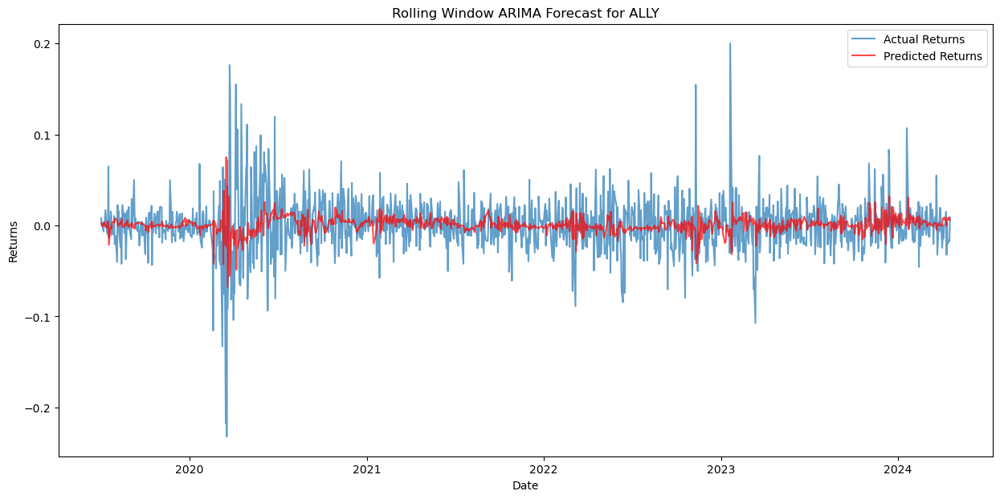

MSE: 0.001021888999892982
RMSE: 0.03196699860626553


In [35]:
returns_mv = returns_mv.dropna()  
window_size_fr = 50  
predictions = []
actual = []
returns_mv = returns_mv.dropna()  
for end in range(window_size_fr, len(returns_mv['ALLY'])):
    train = returns_mv['ALLY'][(end - window_size_fr):end]
    model = ARIMA(train, order=(1, 0, 1))
    model_fit = model.fit()
    pred = model_fit.forecast(steps=1).iloc[0]
    predictions.append(pred)
    actual.append(returns_mv['ALLY'].iloc[end])

actual_fr = np.array(actual_fr)
pred = np.array(pred)
valid_indices_fr = ~np.isnan(pred) & ~np.isnan(actual_fr)
actual_clean = actual_fr[valid_indices_fr]
predictions_clean = pred[valid_indices_fr]
plt.figure(figsize=(15, 7))
plt.plot(returns_mv.index[window_size_fr:window_size_fr + len(actual_clean)], actual_clean, label='Actual Returns', alpha=0.7)
plt.plot(returns_mv.index[window_size_fr:window_size_fr + len(predictions_clean)], predictions_clean, label='Predicted Returns', alpha=0.7, color='red')
plt.title('Rolling Window ARIMA Forecast for ALLY')
plt.xlabel('Date')
plt.ylabel('Returns')
plt.legend()
plt.show()

mse = mean_squared_error(actual_clean, predictions_clean)
rmse = np.sqrt(mse)

print(f'MSE: {mse}')
print(f'RMSE: {rmse}')

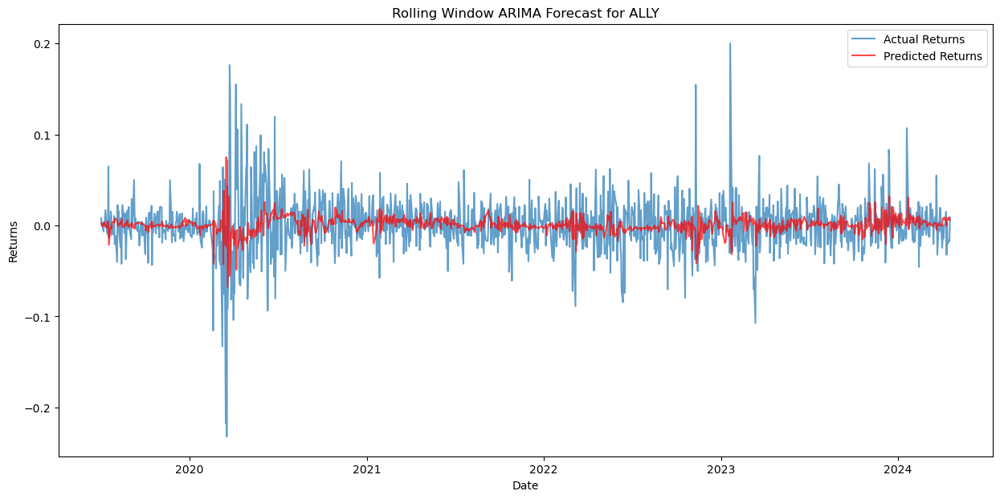

MSE: 0.001021888999892982
RMSE: 0.03196699860626553


In [36]:
plt.figure(figsize=(15, 7))
plt.plot(returns_mv.index[window_size_fr:window_size_fr + len(actual_clean)], actual_clean, label='Actual Returns', alpha=0.7)
plt.plot(returns_mv.index[window_size_fr:window_size_fr + len(predictions_clean)], predictions_clean, label='Predicted Returns', alpha=0.7, color='red')
plt.title('Rolling Window ARIMA Forecast for ALLY')
plt.xlabel('Date')
plt.ylabel('Returns')
plt.legend()
plt.show()
mse = mean_squared_error(actual_clean, predictions_clean)
rmse = np.sqrt(mse)
print(f'MSE: {mse}')
print(f'RMSE: {rmse}')

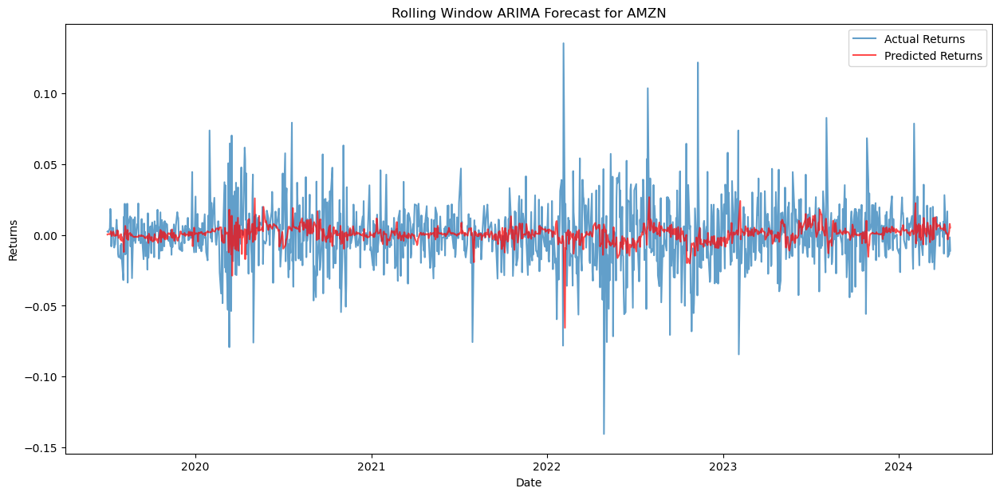

MSE: 0.0005418367239267803
RMSE: 0.023277386535579554


In [149]:
plt.figure(figsize=(15, 7))
plt.plot(returns_mv.index[window_size:window_size + len(actual_clean)], actual_clean, label='Actual Returns', alpha=0.7)
plt.plot(returns_mv.index[window_size:window_size + len(predictions_clean)], predictions_clean, label='Predicted Returns', alpha=0.7, color='red')
plt.title('Rolling Window ARIMA Forecast for AMZN')
plt.xlabel('Date')
plt.ylabel('Returns')
plt.legend()
plt.show()

mse = mean_squared_error(actual_clean, predictions_clean)
rmse = np.sqrt(mse)

print(f'MSE: {mse}')
print(f'RMSE: {rmse}')

/Users/abhishekgoyal/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/abhishekgoyal/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/abhishekgoyal/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/abhishekgoyal/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an int

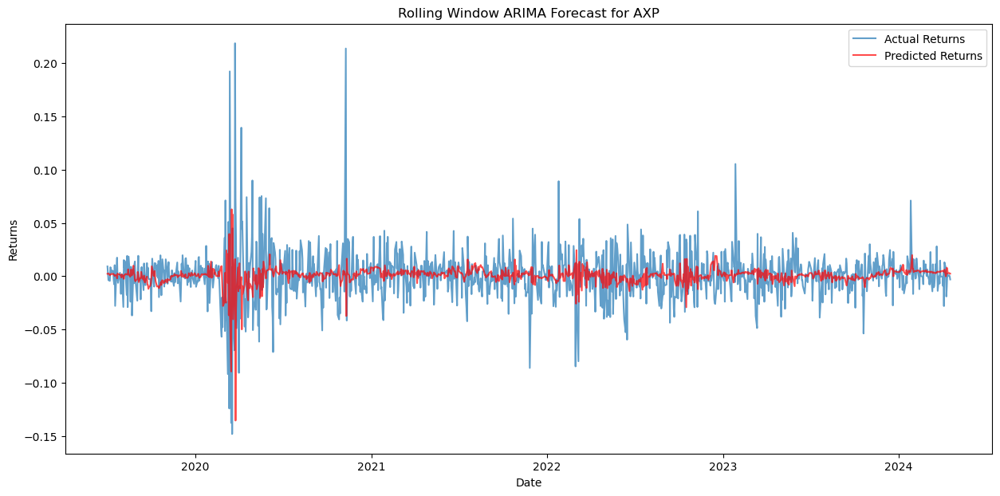

MSE: 0.0006571621335083931
RMSE: 0.025635173756157634


In [150]:
window_size_fr = 50  
returns_mv = returns_mv.dropna()  
predictions = []
actual = []

for end in range(window_size_fr, len(returns_mv['AXP'])):
    train = returns_mv['AXP'][(end - window_size_fr):end]
    model = ARIMA(train, order=(1, 0, 1))
    model_fit = model.fit()
    pred = model_fit.forecast(steps=1).iloc[0]
    predictions.append(pred)
    actual.append(returns_mv['AXP'].iloc[end])

actual_fr = np.array(actual_fr)
pred = np.array(predictions)
valid_indices_fr = ~np.isnan(pred) & ~np.isnan(actual_fr)
predictions_clean = predictions[valid_indices_fr]
actual_clean = actual[valid_indices_fr]
plt.figure(figsize=(15, 7))
plt.plot(returns_mv.index[window_size_fr:window_size_fr + len(actual_clean)], actual_clean, label='Actual Returns', alpha=0.7)
plt.plot(returns_mv.index[window_size_fr:window_size_fr + len(predictions_clean)], predictions_clean, label='Predicted Returns', alpha=0.7, color='red')
plt.title('Rolling Window ARIMA Forecast for AXP')
plt.xlabel('Date')
plt.ylabel('Returns')
plt.legend()
plt.show()

mse = mean_squared_error(actual_clean, predictions_clean)
rmse = np.sqrt(mse)
print(f'MSE: {mse}')
print(f'RMSE: {rmse}')

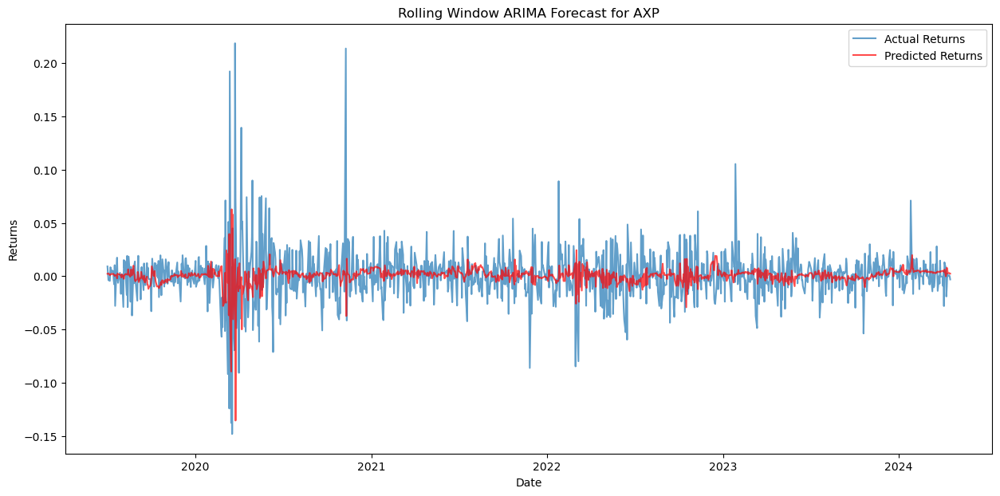

MSE: 0.0006571621335083931
RMSE: 0.025635173756157634


In [151]:
plt.figure(figsize=(15, 7))
plt.plot(returns_mv.index[window_size_fr:window_size_fr + len(actual_clean)], actual_clean, label='Actual Returns', alpha=0.7)
plt.plot(returns_mv.index[window_size_fr:window_size_fr + len(predictions_clean)], predictions_clean, label='Predicted Returns', alpha=0.7, color='red')
plt.title('Rolling Window ARIMA Forecast for AXP')
plt.xlabel('Date')
plt.ylabel('Returns')
plt.legend()
plt.show()

mse = mean_squared_error(actual_clean, predictions_clean)
rmse = np.sqrt(mse)
print(f'MSE: {mse}')
print(f'RMSE: {rmse}')

/Users/abhishekgoyal/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/abhishekgoyal/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/abhishekgoyal/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/abhishekgoyal/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an int

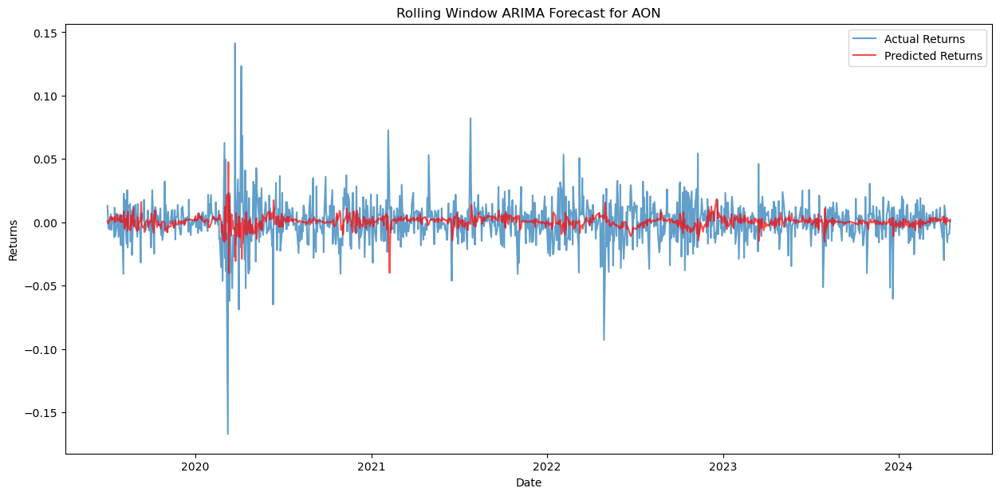

MSE: 0.00031673259728485603
RMSE: 0.017796982814085538


In [152]:
window_size_fr = 50  
returns_mv = returns_mv.dropna()  
predictions = []
actual = []

for end in range(window_size_fr, len(returns_mv['AON'])):
    train = returns_mv['AON'][(end - window_size_fr):end]
    model = ARIMA(train, order=(1, 0, 1))
    model_fit = model.fit()
    pred = model_fit.forecast(steps=1).iloc[0]
    predictions.append(pred)
    actual.append(returns_mv['AON'].iloc[end])

actual_fr = np.array(actual_fr)
pred = np.array(predictions)
valid_indices_fr = ~np.isnan(pred) & ~np.isnan(actual_fr)
predictions_clean = predictions[valid_indices_fr]
actual_clean = actual[valid_indices_fr]

plt.figure(figsize=(15, 7))
plt.plot(returns_mv.index[window_size_fr:window_size_fr + len(actual_clean)], actual_clean, label='Actual Returns', alpha=0.7)
plt.plot(returns_mv.index[window_size_fr:window_size_fr + len(predictions_clean)], predictions_clean, label='Predicted Returns', alpha=0.7, color='red')
plt.title('Rolling Window ARIMA Forecast for AON')
plt.xlabel('Date')
plt.ylabel('Returns')
plt.legend()
plt.show()
mse = mean_squared_error(actual_clean, predictions_clean)
rmse = np.sqrt(mse)
print(f'MSE: {mse}')
print(f'RMSE: {rmse}')

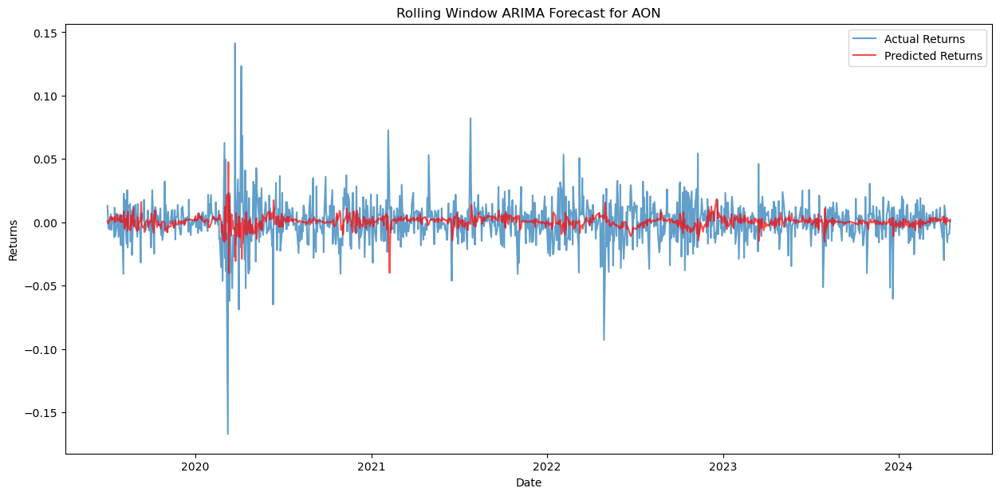

MSE: 0.00031673259728485603
RMSE: 0.017796982814085538


In [153]:
plt.figure(figsize=(15, 7))
plt.plot(returns_mv.index[window_size_fr:window_size_fr + len(actual_clean)], actual_clean, label='Actual Returns', alpha=0.7)
plt.plot(returns_mv.index[window_size_fr:window_size_fr + len(predictions_clean)], predictions_clean, label='Predicted Returns', alpha=0.7, color='red')
plt.title('Rolling Window ARIMA Forecast for AON')
plt.xlabel('Date')
plt.ylabel('Returns')
plt.legend()
plt.show()
mse = mean_squared_error(actual_clean, predictions_clean)
rmse = np.sqrt(mse)
print(f'MSE: {mse}')
print(f'RMSE: {rmse}')

/Users/abhishekgoyal/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/abhishekgoyal/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/abhishekgoyal/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/abhishekgoyal/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an int

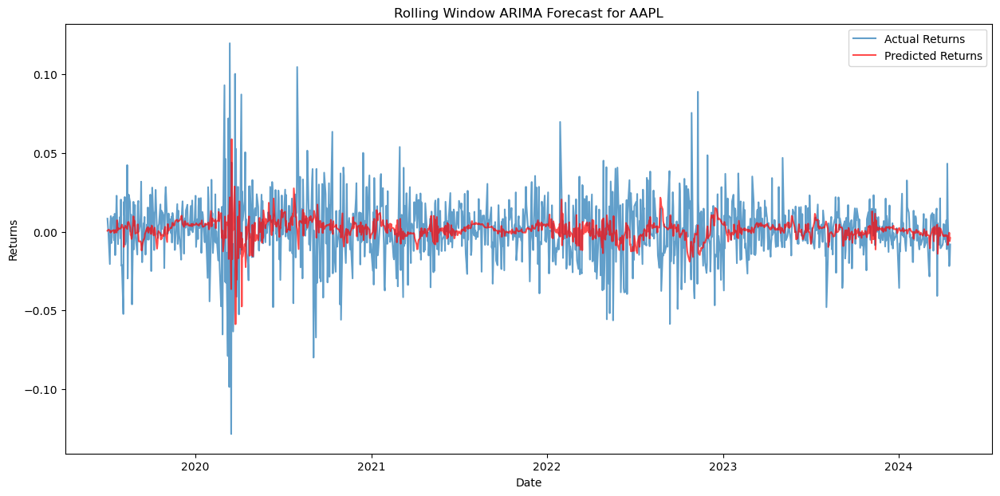

MSE: 0.00042805916047390457
RMSE: 0.020689590630892256


In [154]:
window_size_fr = 50  
returns_mv = returns_mv.dropna()  
predictions = []
actual = []

for end in range(window_size_fr, len(returns_mv['AAPL'])):
    train = returns_mv['AAPL'][(end - window_size_fr):end]
    model = ARIMA(train, order=(1, 0, 1))
    model_fit = model.fit()
    pred = model_fit.forecast(steps=1).iloc[0]
    predictions.append(pred)
    actual.append(returns_mv['AAPL'].iloc[end])

actual_fr = np.array(actual_fr)
pred = np.array(predictions)
valid_indices_fr = ~np.isnan(pred) & ~np.isnan(actual_fr)
predictions_clean = predictions[valid_indices_fr]
actual_clean = actual[valid_indices_fr]

plt.figure(figsize=(15, 7))
plt.plot(returns_mv.index[window_size_fr:window_size_fr + len(actual_clean)], actual_clean, label='Actual Returns', alpha=0.7)
plt.plot(returns_mv.index[window_size_fr:window_size_fr + len(predictions_clean)], predictions_clean, label='Predicted Returns', alpha=0.7, color='red')
plt.title('Rolling Window ARIMA Forecast for AAPL')
plt.xlabel('Date')
plt.ylabel('Returns')
plt.legend()
plt.show()
mse = mean_squared_error(actual_clean, predictions_clean)
rmse = np.sqrt(mse)
print(f'MSE: {mse}')
print(f'RMSE: {rmse}')

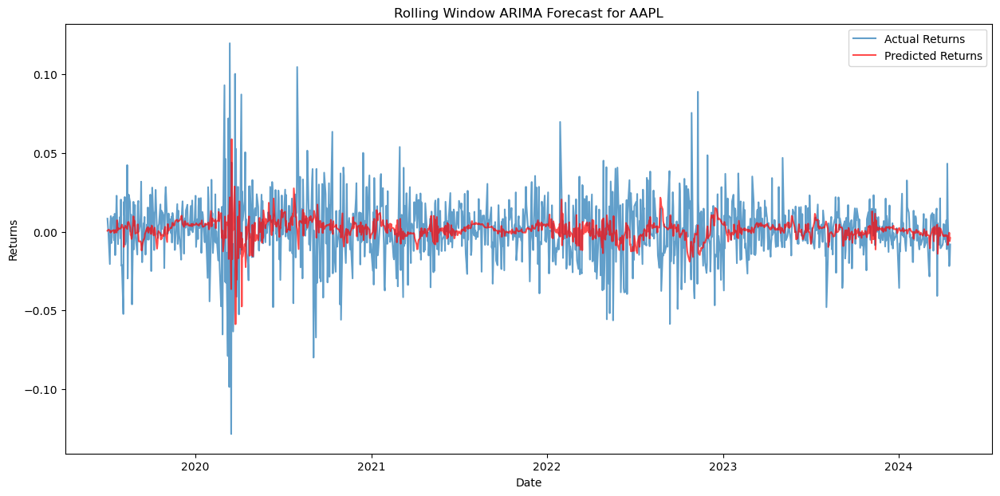

MSE: 0.00042805916047390457
RMSE: 0.020689590630892256


In [155]:
plt.figure(figsize=(15, 7))
plt.plot(returns_mv.index[window_size_fr:window_size_fr + len(actual_clean)], actual_clean, label='Actual Returns', alpha=0.7)
plt.plot(returns_mv.index[window_size_fr:window_size_fr + len(predictions_clean)], predictions_clean, label='Predicted Returns', alpha=0.7, color='red')
plt.title('Rolling Window ARIMA Forecast for AAPL')
plt.xlabel('Date')
plt.ylabel('Returns')
plt.legend()
plt.show()
mse = mean_squared_error(actual_clean, predictions_clean)
rmse = np.sqrt(mse)
print(f'MSE: {mse}')
print(f'RMSE: {rmse}')

# LSTM

Epoch 1/100


/Users/rhettsakurai/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1897
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.6848
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.4506
Epoch 4/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.3419
Epoch 5/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.2787
Epoch 6/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.2314
Epoch 7/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.2037
Epoch 8/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.1523
Epoch 9/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.1362
Epoch 10/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.1150
Epoch 11/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0933
Epoch 12/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0967
Epoch 13/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0729
Epoch 14/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.0643
Epoch 15/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0609
Epoch 16/1

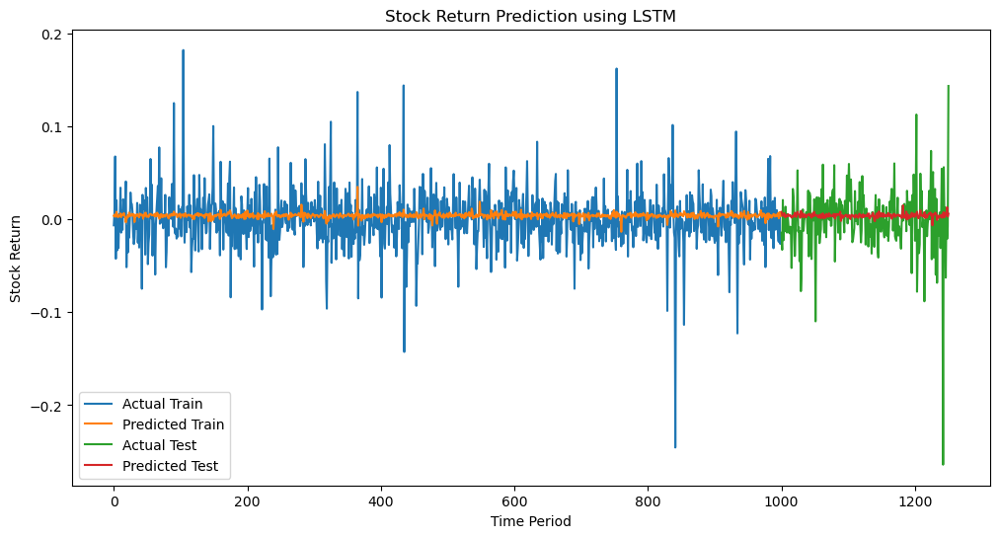

In [32]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.preprocessing import MinMaxscaler_lstm
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from tensorflow.keras.layers import BatchNormalization, Bidirectional
from tensorflow.keras.layers import Dropout

scaler_lstm = MinMaxscaler_lstm(feature_range=(0, 1))
data_lstm = daily_log_portfolio_returns['ALLY'].dropna().values.reshape(-1, 1)
data_scaled_lstm = scaler_lstm.fit_transform(data_lstm)

def create_dataset_lstm(dataset_lstm, look_back_lstm=1):
    X, Y = [], []
    for i in range(len(dataset_lstm) - look_back_lstm - 1):
        a = dataset_lstm[i:(i + look_back_lstm), 0]
        X.append(a)
        Y.append(dataset_lstm[i + look_back_lstm, 0])
    return np.array(X), np.array(Y)

look_back_lstm = 1
X, Y = create_dataset_lstm(data_scaled_lstm, look_back_lstm)
X = np.reshape(X, (X.shape[0], X.shape[1], 1))

X_train_lstm, X_test_lstm, Y_train_lstm, Y_test_lstm = train_test_split(X, Y, test_size=0.2, random_state=42)
model = Sequential()
model.add(Bidirectional(LSTM(100, return_sequences=True, input_shape=(look_back_lstm, 1))))
model.add(Dropout(0.2))
model.add(BatchNormalization()) 
model.add(Bidirectional(LSTM(100, return_sequences=False)))
model.add(Dropout(0.2))
model.add(BatchNormalization()) 
model.add(Dense(1))
model.compile(optimizer='adam', loss='mean_squared_error')

look_back_lstm = 5 
X, Y = create_dataset_lstm(data_scaled_lstm, look_back_lstm)
X = np.reshape(X, (X.shape[0], X.shape[1], 1))
X_train_lstm, X_test_lstm, Y_train_lstm, Y_test_lstm = train_test_split(X, Y, test_size=0.2, random_state=42)
model.fit(X_train_lstm, Y_train_lstm, epochs=100, batch_size=32, verbose=1)  

test_predict = model.predict(X_test_lstm)
train_predict = model.predict(X_train_lstm)

train_predict = scaler_lstm.inverse_transform(train_predict)
Y_train_lstm_inv = scaler_lstm.inverse_transform([Y_train_lstm])
test_predict = scaler_lstm.inverse_transform(test_predict)
Y_test_lstm_inv = scaler_lstm.inverse_transform([Y_test_lstm])

train_rmse = np.sqrt(mean_squared_error(Y_train_lstm_inv[0], train_predict[:,0]))
test_rmse = np.sqrt(mean_squared_error(Y_test_lstm_inv[0], test_predict[:,0]))
print(f'Train RMSE: {train_rmse:.2f}')
print(f'Test RMSE: {test_rmse:.2f}')


plt.figure(figsize=(12,6))
plt.plot(Y_train_lstm_inv[0], label='Actual Train')
plt.plot(train_predict[:, 0], label='Predicted Train')
plt.plot(np.arange(len(Y_train_lstm), len(Y_train_lstm) + len(Y_test_lstm)), Y_test_lstm_inv[0], label='Actual Test')
plt.plot(np.arange(len(Y_train_lstm), len(Y_train_lstm) + len(Y_test_lstm)), test_predict[:, 0], label='Predicted Test')
plt.title('Stock Return Prediction using LSTM')
plt.xlabel('Time Period')
plt.ylabel('Stock Return')
plt.legend()
plt.show()


Epoch 1/100


/Users/rhettsakurai/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 1.6075
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.6086
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4687
Epoch 4/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.3580 
Epoch 5/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.2773
Epoch 6/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.2090
Epoch 7/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.1995
Epoch 8/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.1746
Epoch 9/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.1286 
Epoch 10/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.1023
Epoch 11/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.1106
Epoch 12/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0885 
Epoch 13/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0704
Epoch 14/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0690
Epoch 15/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0540
Epoch 16/1

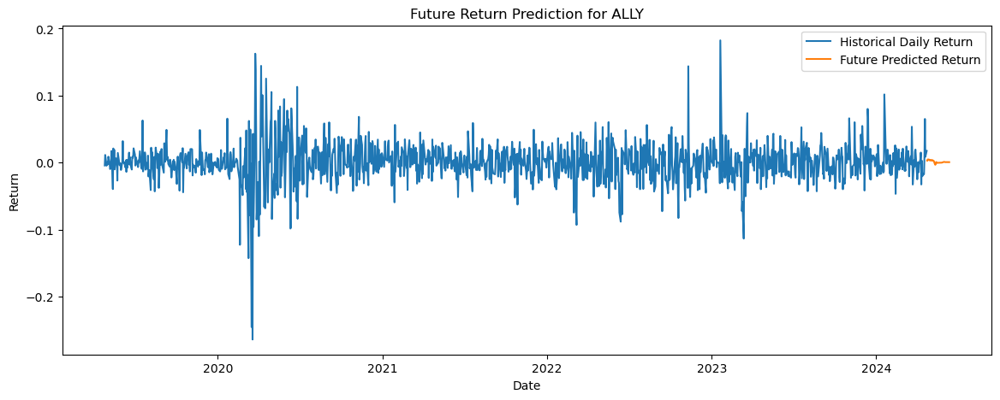

In [31]:
data_lst = daily_log_portfolio_returns['ALLY'].values.reshape(-1, 1)
data = np.nan_to_num(data_lst)
scaler_lst = MinMaxScaler(feature_range=(0, 1))
data_scaled_lst = scaler_lst.fit_transform(data)

def create_dataset(dataset, look_back_lst=1):
    X, Y = [], []
    for i in range(len(dataset) - look_back_lst):
        a = dataset[i:(i + look_back_lst), 0]
        X.append(a)
        Y.append(dataset[i + look_back_lst, 0])
    return np.array(X), np.array(Y)

look_back_lst = 1
X, Y = create_dataset(data_scaled_lst, look_back_lst)
X = np.reshape(X, (X.shape[0], X.shape[1], 1))
X_train_lst, X_test_lst, Y_train_lst, Y_test_lst = train_test_split(X, Y, test_size=0.2, random_state=42)

model = Sequential()
model.add(Bidirectional(LSTM(100, return_sequences=True, input_shape=(look_back_lst, 1))))
model.add(Dropout(0.2))
model.add(BatchNormalization())  
model.add(Bidirectional(LSTM(100, return_sequences=False)))
model.add(Dropout(0.2))
model.add(BatchNormalization()) 
model.add(Dense(1))
model.compile(optimizer='adam', loss='mean_squared_error')

look_back_lst = 5  
X, Y = create_dataset(data_scaled_lst, look_back_lst)
X = np.reshape(X, (X.shape[0], X.shape[1], 1))
X_train_lst, X_test_lst, Y_train_lst, Y_test_lst = train_test_split(X, Y, test_size=0.2, random_state=42)
model.fit(X_train_lst, Y_train_lst, epochs=100, batch_size=32, verbose=1)  
future_predictions = []
current_batch = X[-look_back_lst:]
future_steps = 50

for i in range(future_steps):
    current_pred = model.predict(current_batch)
    future_predictions.append(current_pred[0, 0])
    current_batch = np.roll(current_batch, -1)
    current_batch[-1] = current_pred

future_predictions = scaler_lst.inverse_transform(np.array(future_predictions).reshape(-1, 1))
print(future_predictions)
last_date = daily_log_portfolio_returns.index[-1]
future_dates = pd.date_range(start=last_date, periods=future_steps + 1)[1:] 
future_df = pd.DataFrame(future_predictions, index=future_dates, columns=['Predicted'])

plt.figure(figsize=(14, 5))
plt.plot(daily_log_portfolio_returns['ALLY'], label='Historical Daily Return')
plt.plot(future_df['Predicted'], label='Future Predicted Return')
plt.title('Future Return Prediction for ALLY')
plt.xlabel('Date')
plt.ylabel('Return')
plt.legend()
plt.show()